In [7]:
import mido
import util

# def clean_this_shit(mid,DEBUG = 0):
#     keep = [
# #         'time_signature',
#         'track_name','end_of_track','note_on','note_off']
#     notes = ['note_on','note_off']
#     tracks = []
#     newmid = mido.MidiFile(type = 1)
#     TEMPO = None
#     TSig = None
# #     SMPTE = None 
#     SMPTE = mido.MetaMessage(type = 'smpte_offset',frame_rate=25,hours=0,minutes=0,seconds=0,frames=1,sub_frames=0,time=0)
#     for (i,track) in enumerate(mid.tracks):
#         COUNT = 0
#         INST  = None
#         Didx = []
#         newtrack = mido.MidiTrack()
#         META = 0
# #         CHANNEL = None
#         for (i,msg) in enumerate(track):
#             if msg.type in keep:
#                 if msg.type in notes:
#                     COUNT += 1
#                     if msg.velocity != 0:
#                         msg.velocity = 64
# #                     assert INST is not None,' INST is None \n %s' %msg
# #                     CHANNEL = INST.channel
# #                     assert isinstance(INST.channel,int),"CHANNEL is %s" % CHANNEL
#                     msg.channel  = INST.channel
#                 newtrack.append(msg)
#             else:
#                 if TSig is None:
#                     if msg.type =='time_signature':
#                         TSig = msg
#                         newtrack.append(msg)
#                 if TEMPO is None:
#                     if msg.type =="set_tempo":                                
#                         TEMPO=msg.tempo                
#                         newtrack.append(msg)
#                         newtrack.append(SMPTE)
#                         META = 1
#                 if INST is None:
#                     if msg.type =='program_change':
#     #                     INST = msg.program
#                         INST = msg
# #                         if CHANNEL is None:
# #                             CHANNEL = msg.channel
#                         newtrack.append(msg)

#         if DEBUG:
#             print len(newtrack)
#         if (not META) & (COUNT==0):   #### trackname, inst, end
# #         if (newtrack[0].type =='track_name') and (newtrack[-1].type =='end_of_track'):
#             #### discard this track
#             pass
#         else:
#             tracks.append(newtrack)
#     newmid.tracks = tracks
#     if DEBUG:
#         print newmid
#     assert len(newmid.tracks) != 0, "No tracks left after cleaning"
#     return newmid

def fluidify(fname,sr = 16000,
                SFfile = '/usr/share/sounds/sf2/FluidR3_GM.sf2'):
    outname = '%s.wav' % fname.rsplit('.',1)[0]
    res = !fluidsynth -r {sr} -F {outname} {SFfile} {fname} 
    assert not res.grep('No preset found on*'), "MIDI contains missing preset"
#     res = !fluidsynth {fname}
    return res

def make_test_midi(PROG = 17,fname = 'test.mid'):
#     fname = 'test.mid'
    bname = fname.rsplit('.',1)[0]
    mid = mido.MidiFile(type = 1)

    META_track = mido.MidiTrack()
    META_track += [mido.MetaMessage(type='set_tempo',tempo= 500000,time=0),
              mido.MetaMessage(type = 'smpte_offset', frame_rate=25, hours=0 ,minutes=0 ,seconds=0, frames=1, sub_frames=0,time=0),
              mido.MetaMessage(type = 'time_signature')
             ]
    # <meta message smpte_offset frame_rate=25 hours=0 minutes=0 seconds=0 frames=1 sub_frames=0 time=0>
    # <meta message time_signature numerator=4 denominator=4 clocks_per_click=24 notated_32nd_notes_per_beat=8 time=0>


    mid.tracks.append(META_track)

    track = mido.MidiTrack()
    CHANNEL = 0
#     PROG = 17
    msg = mido.Message(type = 'program_change',channel =CHANNEL, program = PROG-1, time = 50)
    # msg = mido.Message(type = 'note_on',channel =0, program = 42)
    track += [msg]
    for note in range(40,80):
        msg = mido.Message(type = 'note_on',channel = CHANNEL,note = note,time = 5)
        track.append(msg)
        msg = mido.Message(type = 'note_off',channel = CHANNEL,note = note,time =2000)
        track.append(msg)
        pass


    mid.tracks += [track]
    # mid  = clean_this_shit(mid)
    mid.save(fname)
    res = fluidify(fname)
    p = util.piece('%s.wav'%bname)
    p.play()
#     print mid.length
    return mid


In [8]:
def blank_midi():
    mid = mido.MidiFile(type = 1)

    META_track = mido.MidiTrack()
    META_track += [mido.MetaMessage(type='set_tempo',tempo= 500000,time=0),
              mido.MetaMessage(type = 'smpte_offset', frame_rate=25, hours=0 ,minutes=0 ,seconds=0, frames=1, sub_frames=0,time=0),
              mido.MetaMessage(type = 'time_signature')
             ]
    mid.tracks.append(META_track)
#     CHANNEL = 0
    # msg = mido.Message(type = 'note_on',channel =0, program = 42)
#     mid.tracks += [track]
    return mid
def blank_track(CHANNEL = 0,  PROG = 17):
    track = mido.MidiTrack()
    msg = mido.Message(type = 'program_change',channel =CHANNEL, program = PROG-1, time = 50)
    track += [msg]
    return track


In [275]:
S = set(range(10))
%timeit random.choice(list(S))
%timeit random.choice(tuple(S))

The slowest run took 9.13 times longer than the fastest. This could mean that an intermediate result is being cached.
1000000 loops, best of 3: 783 ns per loop
The slowest run took 5.78 times longer than the fastest. This could mean that an intermediate result is being cached.
1000000 loops, best of 3: 660 ns per loop


In [67]:
random.random() < 0.5

False

In [105]:
import random
def track_append_random(track, tick_num,
                       tick_range = None,
                       pitch_range = None,
                       offProb = None):
    if tick_range is None:
        tick_range = range(100,800)
    if pitch_range is None:
        pitch_range = range(50,80)
    for msg in track:
        if hasattr(msg,'channel'):
            CHANNEL = msg.channel
        if msg is None:
            raise Exception('Cannot determine channel')
    signal = [0] * 128
    tick_sum = 0
#     min()
    OnOff = ['note_on','note_off']
    onSet = set()
    while tick_sum < tick_num:
        time = random.choice(tick_range)
#         switch = random.choice([0,1])
#         if switch:
#             pitch = random.choice([x for x in enumerate(signal) if x])
#         else
#         pitch = random.choice(pitch_range)
        switch = not (random.random() < offProb )
#     np.exp( offProb * (10 - len(S)))
        if switch or not onSet:
            pitch = random.choice(pitch_range)
            if pitch in onSet:
                oidx = 1
                onSet.remove(pitch)
            else:
                oidx = 0
                onSet.add(pitch)
        else:
            pitch = random.choice(tuple(onSet))
            onSet.remove(pitch)
            oidx = 1 
                
#         switch= signal[pitch]
#         onlist
        msg = mido.Message(type = OnOff[oidx],channel = CHANNEL,note = pitch,time = time)
#         signal[pitch] = 1 - signal[pitch]
        track.append(msg)
        tick_sum += time
    for pitch in signal:
        if pitch:
            time = 0
            msg = mido.Message(type = OnOff[1],channel = CHANNEL,note = pitch,time = time)
    return track
#     return mid

def random_mid(duration = 48*1000, offProb = 0.5):
    mid  = blank_midi()
#     track = blank_track(0,17)
#     track_append_random( track,duration,offProb = offProb)
#     mid.tracks += [track]

    track = blank_track(1,62)
    track_append_random( track,duration,offProb = offProb)
    mid.tracks += [track]

    track = blank_track(2,63)
    track_append_random( track,duration,offProb = offProb)
    mid.tracks += [track]

    track = blank_track(3,64)
    track_append_random( track,duration,offProb = offProb)
    mid.tracks += [track]

    return mid
    # mid.print_tracks()
DIR = 'sample/MIDI/artificial'
for i in range(50):
#     !rm {DIR}/*.mid
    fname = '%s/%d.mid'%(DIR,i)
#     fname = '%s/%d.single_mid'%(DIR,i)
    print fname
#     !rm {fname}
#     print fname
    mid = random_mid(50000,offProb = .7 )
    mid.save(fname)

sample/MIDI/artificial/0.mid
sample/MIDI/artificial/1.mid
sample/MIDI/artificial/2.mid
sample/MIDI/artificial/3.mid
sample/MIDI/artificial/4.mid
sample/MIDI/artificial/5.mid
sample/MIDI/artificial/6.mid
sample/MIDI/artificial/7.mid
sample/MIDI/artificial/8.mid
sample/MIDI/artificial/9.mid
sample/MIDI/artificial/10.mid
sample/MIDI/artificial/11.mid
sample/MIDI/artificial/12.mid
sample/MIDI/artificial/13.mid
sample/MIDI/artificial/14.mid
sample/MIDI/artificial/15.mid
sample/MIDI/artificial/16.mid
sample/MIDI/artificial/17.mid
sample/MIDI/artificial/18.mid
sample/MIDI/artificial/19.mid
sample/MIDI/artificial/20.mid
sample/MIDI/artificial/21.mid
sample/MIDI/artificial/22.mid
sample/MIDI/artificial/23.mid
sample/MIDI/artificial/24.mid
sample/MIDI/artificial/25.mid
sample/MIDI/artificial/26.mid
sample/MIDI/artificial/27.mid
sample/MIDI/artificial/28.mid
sample/MIDI/artificial/29.mid
sample/MIDI/artificial/30.mid
sample/MIDI/artificial/31.mid
sample/MIDI/artificial/32.mid
sample/MIDI/artifici

In [95]:
!rm {DIR}/*

'sample/MIDI/artificial/99.mid'

In [106]:
fname = 'sample/MIDI/artificial/1.single_mid'
# fname = 'sample/MIDI/artificial/1.mid'
bname = fname.rsplit('.',1)[0]
res = fluidify(fname)
p = util.piece('%s.wav'%bname)
p.play()

<source src="data:audio/wav;base64,UklGRqSpGQBXQVZFZm10IBAAAAABAAEAgD4AAAB9AAACABAAZGF0YYCpGQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD8//z/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA/P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P8AAAAA/P8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA/P/8//z//P8AAAAAAAAAAAAAAAD8/wAAAAAAAAAAAAAAAPz/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPz//P/8/wAAAAD8/wAAAAD8//z/AAD8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8//z//P/8/

In [104]:
p.x0.dtype

dtype('int16')

In [243]:
DIR = 'sample/MIDI/artificial'
! mkdir -p {DIR}
for PROG in [62,63,64]:
    fname = '%s/%s.mid' % (DIR,PROG)
    print fname
    make_test_midi(PROG,fname)

sample/MIDI/artificial/62.mid


<source src="data:audio/wav;base64,UklGRqTSKABXQVZFZm10IBAAAAABAAEAgD4AAAB9AAACABAAZGF0YYDSKAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADt/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAADt/+3/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f8AAAAA7f8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA7f/t/+3/7f8AAAAAAAAAAAAAAADt/wAAAAAAAAAAAAAAAO3/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAO3/7f/t/wAAAADt/wAAAADt/+3/AADt/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/+3/7f/t/wAAAAAAAAAAAAAAAAAAEwATABMAEwAnACcAOwA7ADsAOwAnABMA7f/Z/7L/nv+e/4r/dv9j/0//O/87/yj/KP8o/yj/O/87/zv/O/87/0//T/9j/2P/T/87/yj/FP/s/sX+iv47/gD+sf12/Sf97Pyx/LH8xPzs/BP9Tv2x/Sf+sf47/9n/igA7AewBigIoA7IDYwQVBcYFUAbaBlAHswfaB+4HAggCCO4H7gcCCO4HswcpB1AGFQV3A3YBT/8T/ev6/vhg9yX2OPXW9ML0EfWb9XT2iPew+Nf5E/ti/J392f7F/50AOwHFARQCTwJ2AooCdgJPAigC7AGKATsBAAHYANgAxQCdAHYATgAnAAAA2f/F/8X/7f8nAHYAxQAUATsBTwE7AQABsQBOALL/FP9i/sX9J/3E/GL8J/wn/E78nfwn/cX9iv5j/04AYgGKAsYD2gTGBYsGAgdQB1AHAgefBu4FPAVjBIoDsgLsATsBnQDt/2P/7P5i/tj9O/2J/Oz7dftO+3X7sPv/+2L82Pxi/RT+xf5P/9n/TgDFADsBngHZAQACFAIUAhQC7AGxAXYBYgFiAXYBdgF2AWIBOwHsAJ0AEwB2/7H+AP5O/Z38E/yJ+yb72PqJ+k76Evrr+df5xPmw+bD56/k6+rD6OvvE+2L8E/2x/U/+2f47/57/7f87AJ0A7ABiAewBigI8A9kDYwTtBHcF7gVkBrMG7gYpB1AHjAfaBz0IswgqCbQJFgplCnkKPgrHCSoJUQhQBxUGngQAA2IB2f9i/uz8ifs6+uv4r/eb9sL1YPVg9a/1EfZM9hH2TPVM9CTzJPKa8a3xX/KH8xH16vb++E77iv3Z/wACAQTGBSkHKQjuCGUJtAnHCbQJZQnuCFEInwfuBjwGiwXGBAEEKAM7AhQBxf9P/uz8sPuJ+rD5EvnD+LD4w/jr+Cb5nPlO+ib7J/wn/RT+FP9OAIoB7QJjBNoFFQcpCMcIKgkWCccIUQiMB4sGZAU8BDwDYwKeAdgA7f/Z/nb92PsS+k34/vZ09iX3EvnY+xT/KALtBAIHPQigCCkIFQfuBe0EPATtAwEEFAQUBO0DigPtAhQCJwEnAE//sf4n/rH9O/3E/E78E/zE+4n7JvvY+pz6nPqc+

sample/MIDI/artificial/63.mid


<source src="data:audio/wav;base64,UklGRqTSKABXQVZFZm10IBAAAAABAAEAgD4AAAB9AAACABAAZGF0YYDSKAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD4//j/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P8AAAAA+P8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+P/4//j/+P8AAAAAAAAAAAAAAAD4/wAAAAAAAAAAAAAAAPj/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPj/+P/4/wAAAAD4/wAAAAD4//j/AAD4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4/+//7//v/+f/5//n/97/3v/W/9b/zf/N/8X/xf+8/7T/q/+r/6P/o/+a/5H/if94/2f/Vv9F/zT/Gv8A/97+vP6R/l7+M/4A/s39mv1m/Sv99/zE/Ij8TfwR/NX7mftd+yL73fqZ+lX6CPrE+Xf5Kvnd+Jn4VPgQ+Mz3h/dD9wf33fap9n/2VPYp9v/13PWy9ZD1bfVL9TL1D/X29Nz0w/Sp9I/0fvRt9Fz0S/Q69DH0IPQP9Af0/vP28+3z5fPT88LzsfOg84fzbfNT80LzKfMY8wfz9fLt8u3y7fL18v7yGPMx81PzdvOY88Lz7fMY9EP0dvSp9Nz0D/VL9ZD11PUY9mX2svYh95D3CPiI+Aj5kPki+rP6RPvV+2b8AP2R/Sv+xf5e/wAAogBEAe8BmgJNAwAEtARvBTQG+AbFB5IIXwksCgILzwucDGANHA7PDnoPFBCcEAsRaRG2EfIRFBIlEh0SAxLYEZwRUBH6EIsQFBCUDxMPiw7xDWANzww1DKQLEwuCCvAJVwm0CBIIcAfFBhIGVgWRBLwD3gIAAhEBIgAi/yv+K/0q/Cr7Ivoh+SH4MvdD9lz1h/Sx8/XyQvKg8QbxfvD174bvF+/B7nXuOe4G7uPt0u3K7crt0u3b7ezt9O0G7hfuH+4o7jDuOe5B7kHuSu5S7mTubO6G7qjuyu797jnvhu/b7znwsfAo8bHxS/Lk8o/zQ/T29Lr1dvYy9+73qvhm+RD6xPpv+xH8s/xE/c39RP6z/hH/Xv+a/8X/3v/4/wAAEQARAAgA+P/n/9b/zf/N/97/7/8IACoARABmAIgAqgDMAO8ACAEqATsBTQFeAV4BXgFVAVUBTQFNAVUBZgF3AZEBqgHVAQACPAJ3As0CKwORAwAEgAQJBZoFNAbWBokHRQgBCcYJkwpgCy0MAg3XDa0Oiw96EGERUBI/EzcUJhUVFuoWphdIGMAYDRkVGdoYQBhRFwwWexSlEpQQWA7oC1cJtAYABE0Bmv73+2b59vaY9G3yW/B97srsQevr6bjor+fA5vPlN+Wd5BXkruNI4+Hie+IU4qXhNuHQ4Gng+t+c31DfFN/63gPfLd+D3/rfjOBH4R3iFeMu5GLlt+Ye6KfpOOvj7J/uZPA68hj0//X29+b53vvV/

sample/MIDI/artificial/64.mid


<source src="data:audio/wav;base64,UklGRqTSKABXQVZFZm10IBAAAAABAAEAgD4AAAB9AAACABAAZGF0YYDSKAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAD4//j/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P8AAAAA+P8AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA+P/4//j/+P8AAAAAAAAAAAAAAAD4/wAAAAAAAAAAAAAAAPj/AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAPj/+P/4/wAAAAD4/wAAAAD4//j/AAD4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/4//j/+P/v/+//7//v/+//7//v/+//5//n/+f/5//e/97/3v/V/9X/zf/N/8T/u/+z/6r/of+Z/5D/h/9//3b/Zf9c/1P/Qv85/zH/H/8X/wb//f7s/uP+0v7A/q/+pv6V/oT+cv5h/lD+Pv4t/hz+C/75/ej91/3F/bT9q/2a/Yn9d/1m/VX9Q/0y/Sn9GP0H/fb87fzc/Mr8wvyw/Kj8lvyO/IX8dPxr/Fr8UfxA/Df8Jvwd/Az8A/z7++n74fvY+8f7vvu++7X7tfut+7X7tfu1+777x/vY++H78vsD/BX8L/xI/GL8fPyW/Ln83PwH/Sn9Vf2J/bT96P0k/lj+nv7a/h//Zf+q/+//PACKAOEANwGFAeQBOwKaAvkCYQPJAzEEmQQJBXoF8wVsBuUGZwfpB2sI7AhuCecJaQriClwLzAs0DJMM6gwvDWsNnw3CDdwN5Q3lDdMNuQ2XDWsNLw3yDK0MXwwJDLILUwv0CpQKLQrFCV0J7Ah8CAsIigcQB4YG+wVxBdUEOQSVA+gCMgJ8Ab4A+P8x/2r+mv3K/AP8NPtk+p353vgX+GL3rPb29VL1rfQR9H7z9PJy8vnxiPEg8cHwa/AU8Mbviu9E7wjv1O6g7mzuQe4V7urtyO2l7YLtYO1G7TTtI+0S7RLtEu0a7TTtTu167aXt4u0n7n3u1O4876zvHfCf8CDxovE18sDyU/Pd83H0BPWO9SH2rPYu96/3Mfii+BL5g/ni+UH6mPru+jz7gfvP+xX8Wvyf/OT8Mv2A/df9Lf6E/uP+S/+z/xkAgQDyAFoBwgEyApoCAgNqA8kDMQSQBPgEVwW/BScGjwb/BngH8QdrCPUIiAkbCrcKZAsaDNAMlw1mDj8PFxABEfMR5hLhE+QU6BX0FgAYFRkqGj8bXRx6HZgerR/CIM4hwSKiI2kkBCV+JbIlsiVkJcgk3iOeIv8gGh/WHFYahxeFFFcR/w2MCggHjAMIAJ/8T/kZ9hbzP/CU7Rzr2OjI5uPkO+Ot4VPgE9/13fHc/9se20baZdmV2MXX7dYm1l/VmNTr00bTvNJL0v3R0tHJ0fXRQ9K80mnTOdQ81WvWvdc52dnaktx33m3gfeKe5

In [ ]:
from util_midi import persistent
for PROG in persistent:
    make_test_midi(PROG)
    energy()

[WARN]:No notes were detected in <meta message set_tempo tempo=500000 time=0>
3468
(3467,) (3468,)
(3467,) (3467,)


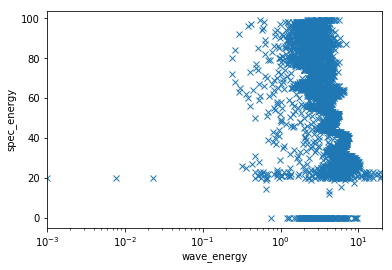

In [231]:

energy()
# plt.gca().set_xscale('log')


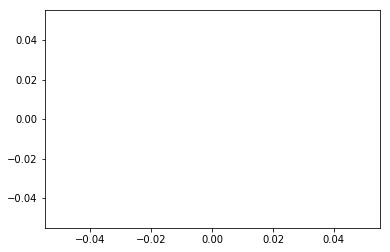

In [132]:
# np.isnan(X).mean()
plt.plot(Xs[X<0].ravel())
(Xs[X<0]**2).sum(axis = 1)
# plt.plot(X<0)
plt.show()

In [164]:
plt.show()

In [230]:
import util_midi
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
def energy():
    Ys0 = util_midi.extract_midi_roll(fname,DEBUG=0)
    p = util.piece('%s.wav'%bname)
    p.x0 = (p.x0.astype('float32')/2**15)
    Xs = p.to_chunk(20)
    Xs0 = Xs[0:]
    Ys = Ys0.copy()
    Xs = Xs0.copy()

#     offset = 0

    offset = 0
    if offset:
        Xs = Xs[offset:]
        Ys = Ys[:-offset]

    # print Xs.shape,Ys.shape
    w_eng = np.sqrt(np.power(Xs,2)).sum(axis =  1)
    # w_eng = np.std(Xs,axis = 1)
    # s_eng = ((Ys > 0) * np.arange(128)[None,:]).sum(axis = 1)
    fs = np.arange(128)[None,:]
#     s_eng = (2*Ys * np.arange(128)[None,:]).sum(axis = 1)
    s_eng = (2*Ys * fs).sum(axis = 1)
#     s_eng = (2*Ys * np.exp(-fs)).sum(axis = 1)

    X = w_eng
    Y = s_eng
    print X.shape,Y.shape
    X = X[:len(Y)]
    Y = Y[:len(X)]
    print X.shape,Y.shape

    BINS = 30
    
    
    plt.plot(X,Y,'x')
    plt.xlabel('wave_energy')
    plt.ylabel('spec_energy')
    plt.gca().set_xscale('log')
    plt.xlim(0,20)
    plt.show()
    
    
#     plt.figure()
#     plt.hist2d(X,Y
#                ,bins=BINS
#                ,norm = mpl.colors.LogNorm());
#     plt.xlim(0,20)
# #     plt.ylim(0,100)
#     plt.show()

    # plt.figure()

In [175]:
SDT = 0.05
import IPython.display as ipd
import mir_eval
def midi_roll_play(mroll,chroma = False, sample_dt = 0.05):
    if mroll.shape[-1]==12:
        freqs = mir_eval.transcription.util.midi_to_hz(np.arange(60,72))
    else:
        freqs = mir_eval.transcription.util.midi_to_hz(np.arange(0,128))
#     mroll = np.log(mroll+1E-5)
    SHAPE = mroll.shape
    mroll = mroll.T * freqs.T[:,None]
#     mroll = norm_by_freq(mroll)
    Xs_exp = mir_eval.sonify.time_frequency( mroll ,freqs,times = sample_dt*np.arange(SHAPE[0]),fs = 16000)
#     Xs_exp = np.hstack([Xs_exp,[0]*(len(cpXs)-len(Xs_exp))])
    return Xs_exp/np.sqrt((Xs_exp**2).mean())
import util_midi
from util_midi import *
import librosa
import librosa.display
def cqt(p):
    sr = p.bitrate
    y  = p.xs
    chroma_cq = librosa.feature.chroma_cqt(y=y, sr=sr, 
#                                            window = 50,
#                                           hop_length = 1
                                          )
    librosa.display.specshow(chroma_cq, y_axis='chroma', x_axis='time')
    plt.show()
    return chroma_cq.T
def stft(p):
    sr = p.bitrate
    y  = p.xs
    chroma_cq = librosa.feature.chroma_stft(y=y, sr=sr,
                                           n_chroma=12, n_fft=800,
                                           hop_length=800)
    librosa.display.specshow(chroma_cq, y_axis='chroma', x_axis='time')
    plt.show()
    return chroma_cq.T

def mroll2chroma(mroll,norm = 1):
#     if chroma:
    if mroll.shape[-1]==12:
        return mroll
    mroll = mroll[:,:120]
    SP = list(mroll.shape)
#         SP[1] = 12; SP.append(-1)
#         mroll = np.reshape(mroll,SP).sum(axis = 2)
    SP[1] = -1; SP.append(12)
#     cmroll = np.clip(cmroll,0,1)
    #     cmroll = 
    if norm:
        wt = (np.linspace(0,1,120)).T
        sqwt = wt**2
        sq_mroll = mroll **2
        SUM = (sq_mroll*sqwt).sum(axis = 1,keepdims = 1)
        SUM[SUM==0]=1
        mroll = mroll/SUM.astype('float32')

#         SUM = cmroll.sum(axis = 1,keepdims =1 )
#         SUM[SUM==0]=1
#         cmroll = cmroll / SUM.astype(float)
    cmroll = np.reshape(mroll,SP).sum(axis = 1)
#         cmroll = np.clip(cmroll,0,1)
    return cmroll 
#     print mroll.shape

def midi_roll_play(mroll,chroma = False, sample_dt = 0.05):
    if mroll.shape[-1]==12:
        freqs = mir_eval.transcription.util.midi_to_hz(np.arange(60,72))
    else:
        freqs = mir_eval.transcription.util.midi_to_hz(np.arange(0,128))
#     mroll = np.log(mroll+1E-5)
    SHAPE = mroll.shape
    mroll = mroll.T * freqs.T[:,None]
#     mroll = norm_by_freq(mroll)
    Xs_exp = mir_eval.sonify.time_frequency( mroll ,freqs,times = sample_dt*np.arange(SHAPE[0]),fs = 16000)
#     Xs_exp = np.hstack([Xs_exp,[0]*(len(cpXs)-len(Xs_exp))])
    return Xs_exp/np.sqrt((Xs_exp**2).mean())

In [150]:
print mid.length
print p.t0[-1]

24.21875
24.2279375


0.744
(4300, 800) (4300, 128)
(143200,) (143200,)


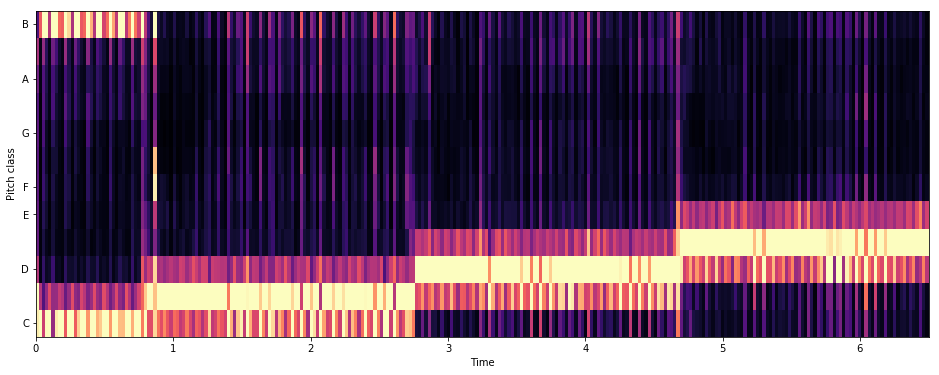

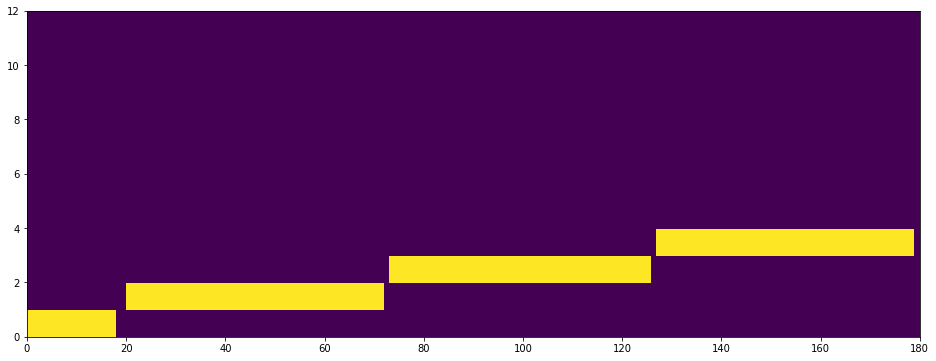

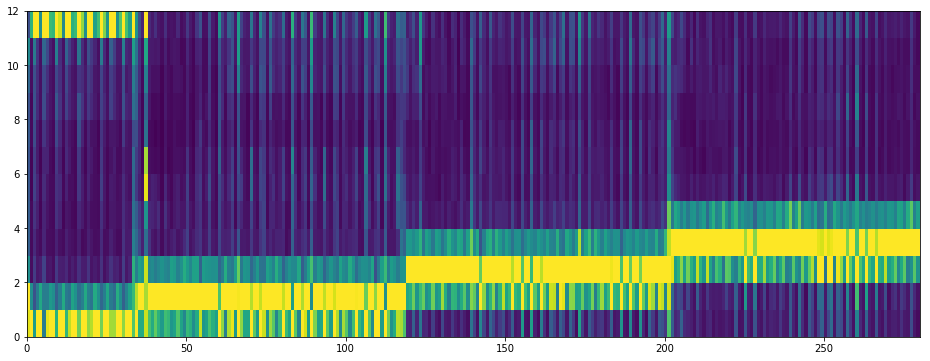

In [244]:
# import mir_eval,util_midi
# Xs,Ys = np.load('%s.both.npy'%bname)
# Xs = np.squeeze(Xs)
# print Xs.shape,Ys.shape
# Xs = chunks
# Ys = mroll_ext
Xs = Xs0.copy()
Ys = Ys0.copy()

offset = (0.93 * 0.04 * 1/SDT)
print offset
offset= int(offset)
offset = 1
if offset:
    Xs = Xs[offset:]
    Ys = Ys[:-offset]

truncate = -180
print Xs.shape,Ys.shape

if truncate > 0:
    Xs = Xs[:truncate + 1]
    Ys = Ys[:truncate + 1]
elif truncate < 0:
    Xs = Xs[truncate:]
    Ys = Ys[truncate:]
    
# Ys = util_midi.mroll2chroma(Ys)

cXs = np.concatenate(Xs[:-1],axis = 0)
cYs = midi_roll_play(Ys, sample_dt = SDT)
print cXs.shape,cYs.shape
sr = 16000
ipd.display(ipd.Audio(2*cYs,rate = sr))
ipd.display(ipd.Audio(cXs,rate = sr))
ipd.display(ipd.Audio(cYs+40*cXs,rate = sr))
# ipd.display(ipd.Audio(cXs,rate = 8000))

plt.figure(figsize = [16,6])
p.xs = cXs
# q1 = stft(p)
q1 = cqt(p)


plt.figure(figsize = [16,6])
p.xs = cYs[offset:]
# q2 = cqt(p)
ccYs = mroll2chroma(Ys,norm = 0) > 0
# print N
q2 = ccYs 
plt.pcolormesh(q2.T,)
plt.show()

plt.figure(figsize = [16,6])
plt.pcolormesh( (q1).T,)
plt.show()

In [245]:
mido.second2tick(0.05,ticks_per_beat=mid.ticks_per_beat,tempo=util_midi.get_tempo(mid ))

48.0

In [ ]:
# from util_midi import persistent
def clean_this_shit(mid,DEBUG = 0):
    keep = [
#         'time_signature',
        'track_name','end_of_track','note_on','note_off']
    notes = ['note_on','note_off']
    tracks = []
    newmid = mido.MidiFile(type = 1)
    TEMPO = None
    TSig = None
#     SMPTE = None 
    SMPTE = mido.MetaMessage(type = 'smpte_offset',frame_rate=25,hours=0,minutes=0,seconds=0,frames=1,sub_frames=0,time=0)
    for (i,track) in enumerate(mid.tracks):
        COUNT = 0
        INST  = None
        Didx = []
        newtrack = mido.MidiTrack()
        META = 0
#         CHANNEL = None
        for (i,msg) in enumerate(track):
            if msg.type in keep:
                if msg.type in notes:
                    COUNT += 1
                    if msg.velocity != 0:
                        msg.velocity = 64
#                     assert INST is not None,' INST is None \n %s' %msg
#                     CHANNEL = INST.channel
#                     assert isinstance(INST.channel,int),"CHANNEL is %s" % CHANNEL
                    msg.channel  = INST.channel
                newtrack.append(msg)
            else:
                if TSig is None:
                    if msg.type =='time_signature':
                        TSig = msg
                        newtrack.append(msg)
                if TEMPO is None:
                    if msg.type =="set_tempo":                                
                        TEMPO=msg.tempo                
                        newtrack.append(msg)
                        newtrack.append(SMPTE)
                        META = 1
                if INST is None:
                    if msg.type =='program_change':
    #                     INST = msg.program
                        INST = msg
#                         if CHANNEL is None:
#                             CHANNEL = msg.channel
                        newtrack.append(msg)

        if DEBUG:
            print len(newtrack)
        if (not META) & (COUNT==0):   #### trackname, inst, end
#         if (newtrack[0].type =='track_name') and (newtrack[-1].type =='end_of_track'):
            #### discard this track
            pass
        else:
            tracks.append(newtrack)
    newmid.tracks = tracks
    if DEBUG:
        print newmid
    assert len(newmid.tracks) != 0, "No tracks left after cleaning"
    return newmid
# mid
print mid
import copy
clean_this_shit(copy.copy(mid)).print_tracks()
                # get_tempo(mid).print_tracks()